# Рынок заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.\
\
Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.\
\
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.\
\
Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## План проекта
### Цели проекта:
1. Выяснить сколько кофеен в датасете и в каких районах их больше всего, чтобы определить лучшее местоположение для открытия
2. Выяснить наличие круглосуточных кофеен
3. Какие рейтинги у кофеен и как они распределены по районам
4. Какая стоимость чашки капучино приемлема для потребителя и на какую стоимость необходимо ориентироваться при открытии и почему
5. Дать общие рекомендации по открытию кофейни в Москве

### Задачи проекта:
1. Создать столбец street с названиями улиц из столбца с адресом;
2. Создать столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7);
3. Исследовать количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее;
4. Исследовать количество посадочных мест в местах по категориям заведений;
5. Рассмотреть и изобразить соотношение сетевых и несетевых заведений;
6. Исследуйте данные по категории сетевые и несетевые заведения;
7. Найти топ-15 популярных сетей в Москве и исследовать их;
8. Отобразить общее количество заведений и количество заведений каждой категории по районам;
9. Визуализировать распределение средних рейтингов по категориям заведений;
10. Построить хороплет со средним рейтингом заведений каждого района;
11. Найдите топ-15 улиц по количеству заведений;
12. Найдите улицы, на которых находится только один объект общепита
13. Посчитайте медиану средних чеков заведений для каждого района и построить хороплет с полученными значениями для каждого района;
14. Ответить на вопросы заказчика

## Открываем данные

In [1]:
# импортируем библиотеки
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
import datetime as dt
import re
import plotly.express as px
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
from folium.features import CustomIcon
import json

In [2]:
conda list # указываем версии библиотек

# packages in environment at /opt/anaconda3:
#
# Name                    Version                   Build  Channel
abseil-cpp                20230802.0           h313beb8_2  
aext-assistant            0.4.0           py311h5f3b9a2_jl3_0  
aext-assistant-server     0.4.0           py311hca03da5_0  
aext-core                 0.4.0           py311h5f3b9a2_jl3_0  
aext-core-server          0.4.0           py311hca03da5_0  
aext-shared               0.4.0           py311hca03da5_0  
aiofiles                  22.1.0          py311hca03da5_0  
aiohttp                   3.9.3           py311h80987f9_0  
aiosignal                 1.2.0              pyhd3eb1b0_0  
aiosqlite                 0.18.0          py311hca03da5_0  
amphi-etl                 0.5.5                    pypi_0    pypi
anaconda-anon-usage       0.4.3           py311hd6b623d_100  
anaconda-catalogs         0.2.0           py311hca03da5_0  
anaconda-client           1.12.3          py311hca03da5_0  
anaconda-cloud-auth       0.5.


Note: you may need to restart the kernel to use updated packages.


In [3]:
# откроем датасет
try:
    data = pd.read_csv('/Users/bis.partnermail.ru/Desktop/Яндекс Практикум/datasets/moscow_places.csv')
except:
    data = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
# выведем размер датасета
print('Размер таблицы составляет:',data.shape[0], 'строк и',data.shape[1], 'столбцов')

Размер таблицы составляет: 8406 строк и 14 столбцов


In [5]:
# посмотрим первые строки
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [6]:
# посмотрим на информацию о данных
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [7]:
# выведем описательные статистики
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


### Вывод
Впервые открыв данные, удалось выяснить следующие аспекты:
1. Размер данных составляет 8406 строк и 14 столбцов
2. Данные содержат пропуски в 6 столбцах:
    * информация о днях и часах работы;
    * категория цен в заведении;
    * средняя стоимость заказа;
    * число с оценкой среднего чека;
    * число с оценкой одной чашки капучино;
    * количество посадочных мест;
3. В данных содержится много пустых значений, посмотрим дальше можно ли их отчистить или стоит оставить
4. Ярковыраженных выбросов не наблюдается в данных, но так как цель основателей фонда открыть доступную кофейню, возможно можно будет отбросить рестораны с высоким чеком при сравнительном анализе
5. В данных содержится **5.512 уникальных заведений** (не забываем, что в данных содержатся сети кафе и ресторанов)
6. Всего встречается 8 категорий заведений:
    * кафе;
    * ресторан;
    * кофейня;
    * пиццерия;
    * бар,паб;
    * быстрое питание;
    * булочная;
    * столовая.
7. Заведения располагаются в 9 районах Москвы. Наибольшее количество заведений находится в Центральном АО Москвы - 2.242 заведения, а меньше всего находится в Северо-Западном АО Москвы.

|Наименование региона|Количество заведений
|:-|:-:|
|Центральный административный округ|2 242|
|Северный административный округ|900|
|Южный административный округ|892|
|Северо-Восточный административный округ|891|
|Западный административный округ|851|
|Восточный административный округ|798|
|Юго-Восточный административный округ|714|
|Юго-Западный административный округ|709|
|Северо-Западный административный округ|409|

## Предобработка данных

Для начала преобразуем данные для удобства поиска дубликатов и удобства обращения к ним.\
На прошлом шаге уже были преобразованы названия заведений (приведены к нижнему регистру).

In [8]:
# преобразуем данные в названиях, чтобы посмотреть
# сколько уникальных заведений содержится в данных
data['name'] = data['name'].str.lower()

In [9]:
print('В данных содержится',data['name'].nunique(),'уникальных заведений')

В данных содержится 5512 уникальных заведений


In [10]:
# посмотрим какие заведения содержатся в данных
data['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [11]:
# в каких районах располагаются заведения
# и заодно кол-во заведений в каждом районе
data['district'].value_counts()

district
Центральный административный округ         2242
Северный административный округ             900
Южный административный округ                892
Северо-Восточный административный округ     891
Западный административный округ             851
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: count, dtype: int64

Приведем столбец `address` к нижнему регистру

Далее займемся поиском явных и неявных дубликатов, создадим столбец `street` с названиями улиц из столбца с адресом и создадим столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
* логическое значение <span style="color:green"> True</span> — если заведение работает ежедневно и круглосуточно;
* логическое значение <span style="color:red"> False</span> — в противоположном случае.

### Обработка значений

In [12]:
# приведем столбец 'adress' к нижнему регистру
data['address'] = data['address'].str.lower()
data['address'].head()

0             москва, улица дыбенко, 7/1
1     москва, улица дыбенко, 36, корп. 1
2         москва, клязьминская улица, 15
3    москва, улица маршала федоренко, 12
4        москва, правобережная улица, 1б
Name: address, dtype: object

### Поиск и устранение дубликатов и пустых значений

In [13]:
# выведем пустые значения
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Как и говорилось ранее, в таблице содержатся пустые значения в 6 столбцах. Заполнение пустных данных медианным или средним значением сильно исказит результат при исследовании, поэтому трогать пустые значения не стоит.

Посмотрим теперь данные на наличие дублей. Так как мы привели данные к единому регистру, то будет проще их обнаружить.\
Уже проверили, что в данных встречаются дубли по наименованиям заведений, но оно и понятно, так как в данных встречаются сети заведений.\
Попробуем выявить дубли не только по наименованию, но и по столбцам сразу. Вдруг в данные попали заведения два раза.

In [14]:
# проверим данные на наличие дублей по двум столбцам
# name и address
data[data.duplicated(subset=['name','address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
215,кафе,кафе,"москва, парк ангарские пруды",Северный административный округ,"ежедневно, 10:00–22:00",55.881438,37.531848,3.2,NaN,NaN,NaN,NaN,0,NaN
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","москва, проспект мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"москва, ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Обнаружено, что в данных содержится всего 4 дубля, если фильтровать по наименованию и адресу.

In [15]:
# проверим данные на наличие дублей по четырем столбцам
# name, address, lat и lag
data[data.duplicated(subset=['name','address','lat','lng'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"москва, волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0


Если фильтровать по четырем столбцам сразу - name, address, lat и lag, то получается, что в данных присутствует 1 дубль, который находится по координатам в том же месте.

В итоге, удаллось выявить всего 4 дубликата по наименованию и адресу. Устраним дубликаты и перейдем к созданию столбцов.

In [16]:
# удалим дубликаты из данных
data = data.drop_duplicates(subset=['name','address'])

# выведем размер датафрейма после удаления строк
data.shape

(8402, 14)

Теперь займемся созданием столбцов:
1. Создадим столбец `street` с названиями улиц из столбца с адресом;
2. Создадим столбец `is_24_7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

In [17]:
# в переменную words запишем слова и символы для поиска
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'село','аллея','бульвар','набережная','тупик','линия', 'просек','пр-т','-й','-я','парк']

# заведем шаблон для поиска слов
str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

# создадим столбец street
data['street'] = data['address'].str.extract(str_pat, flags=re.I)
data['street'].sample(10)

5263    большая серпуховская улица
1706        ленинградский проспект
3452             новинский бульвар
255                  улица лескова
5614               душинская улица
5073               пятницкая улица
6849           улица островитянова
2205           2-я рыбинская улица
6800          проспект вернадского
5629             аминьевское шоссе
Name: street, dtype: object

In [18]:
# посмотрим в скольких строках данные не заполнились
print('В столбце street',data['street'].isna().sum(),'пустых значений')

В столбце street 144 пустых значений


Выведем строки, где данные в столбце `street` не заполнились.

In [19]:
data[data['street'].isna()].sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
1256,шикер люляш-кебап,ресторан,"москва, северо-западный административный округ...",Северо-Западный административный округ,пт-вс круглосуточно,55.807413,37.424888,4.5,NaN,NaN,NaN,NaN,0,NaN,NaN
7766,eco шаурма,быстрое питание,"москва, сумская, 2/12",Южный административный округ,"ежедневно, круглосуточно",55.623818,37.608020,3.6,низкие,Средний счёт:50–200 ₽,125.0,NaN,1,NaN,NaN
2145,гриль парк,"бар,паб","москва, 3-й лучевой просек",Восточный административный округ,"ежедневно, 11:00–22:00",55.798255,37.671360,4.1,средние,Средний счёт:700–1000 ₽,850.0,NaN,1,NaN,NaN
5404,веранда,ресторан,"москва, парк радуга",Восточный административный округ,"ежедневно, 11:00–22:00",55.732038,37.820578,3.9,NaN,NaN,NaN,NaN,1,NaN,NaN
5191,osteria mario,пиццерия,"москва, павелецкая площадь",Центральный административный округ,"ежедневно, 10:00–22:00",55.730293,37.637404,4.3,NaN,NaN,NaN,NaN,1,NaN,NaN
5501,руины ресторана лето,кафе,"москва, измайловский парк культуры и отдыха",Восточный административный округ,NaN,55.773002,37.757116,3.7,NaN,NaN,NaN,NaN,0,NaN,NaN
2365,скитская трапезная,кафе,"москва, парк сокольники",Восточный административный округ,"ежедневно, 10:00–17:00",55.801396,37.683698,4.0,NaN,Средний счёт:250–300 ₽,275.0,NaN,0,NaN,NaN
5741,буфет ботанического сада,кафе,"москва, ботанический сад московского государст...",Западный административный округ,"ежедневно, 10:00–20:00",55.705555,37.523839,4.3,NaN,NaN,NaN,NaN,0,NaN,NaN
64,testo мания,кофейня,"москва, лианозовский парк культуры и отдыха",Северо-Восточный административный округ,"ежедневно, 09:00–21:00",55.900058,37.570544,4.1,NaN,NaN,NaN,NaN,0,NaN,NaN
7206,ваниль,кафе,"москва, музей-заповедник коломенское",Южный административный округ,NaN,55.666519,37.669015,5.0,NaN,NaN,NaN,NaN,0,NaN,NaN


Заметим, что данные не заполнились, так как в адресе не содержались ключевые слова.\
В вывыденных данных видно, что заведения располагаются в парках или в данных не содержится информация об улицах. Пропуски составляют менее 2% от общего числа строк, поэтому оставим пропуски как есть.

In [20]:
# заполним пропуски в данных на строку "неизвестно"
data.hours = data.hours.fillna('неизвестно')

# создадим столбец is_24/7
def time (value):
    if 'ежедневно, круглосуточно' in value:
        return True
    else:
        return False
    
data['is_24_7'] = data['hours'].apply(time)

data.head(7)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,правобережная улица,False
5,sergio pizza,пиццерия,"москва, ижорская улица, вл8б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,ижорская улица,False
6,огни города,"бар,паб","москва, клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,клязьминская улица,False


In [21]:
data[data['hours'] == 'неизвестно']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
38,ижора,булочная,"москва, ижорский проезд, 5а",Северный административный округ,неизвестно,55.888366,37.514856,4.4,NaN,NaN,NaN,NaN,0,NaN,ижорский проезд,False
40,кафе,кафе,"москва, ижорская улица, 18, стр. 1",Северный административный округ,неизвестно,55.895115,37.524902,3.7,NaN,NaN,NaN,NaN,0,NaN,ижорская улица,False
44,кафетерий,кафе,"москва, ангарская улица, 24а",Северный административный округ,неизвестно,55.876289,37.519315,3.8,NaN,NaN,NaN,NaN,1,8.0,ангарская улица,False
56,рыба из тандыра,быстрое питание,"москва, коровинское шоссе, 46, стр. 5",Северный административный округ,неизвестно,55.888010,37.515960,1.5,NaN,NaN,NaN,NaN,0,NaN,коровинское шоссе,False
108,кафе,"бар,паб","москва, мкад, 82-й километр, вл18",Северо-Восточный административный округ,неизвестно,55.908930,37.558777,4.2,NaN,NaN,NaN,NaN,0,NaN,82-й километр,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8236,1у,кафе,"москва, нагатинская набережная, 40/1к1",Южный административный округ,неизвестно,55.685528,37.673546,3.4,NaN,NaN,NaN,NaN,0,NaN,нагатинская набережная,False
8375,улица гурьянова 55,кафе,"москва, улица гурьянова, 55",Юго-Восточный административный округ,неизвестно,55.679981,37.717034,4.5,NaN,NaN,NaN,NaN,0,NaN,улица гурьянова,False
8378,восточно-грузинская кухня,быстрое питание,"москва, зеленодольская улица, 32, корп. 3",Юго-Восточный административный округ,неизвестно,55.710540,37.767864,4.3,NaN,NaN,NaN,NaN,0,120.0,зеленодольская улица,False
8381,аэлита,кафе,"москва, ферганская улица, 8, корп. 2, стр. 1",Юго-Восточный административный округ,неизвестно,55.708871,37.803831,3.8,NaN,NaN,NaN,NaN,0,30.0,ферганская улица,False


In [22]:
# посмотрим сколько заведений работает круглосуточно
data['is_24_7'].value_counts()

is_24_7
False    7672
True      730
Name: count, dtype: int64

In [23]:
# посмотрим сколько заведений работает круглосуточно
# не учитывая те заведения, где неизвестны часы работы
data[data['hours'] != 'неизвестно']['is_24_7'].value_counts()

is_24_7
False    7137
True      730
Name: count, dtype: int64

Точно известно, что всего заведений, работающих круглосуточно, – **5 061**.\
Количество заведений, которые работают в определенные временные рамки - **2 806**.\
Об остальных заведениях нет информации о часах работы, поэтому значение в столбце `is_24/7` - <span style="color:red"> False</span>. 

### Вывод
В предобработке данных удалось выявить всего 4 дубликата по нескольким столбцам (наименование и адрес). Дубликаты были удалены. Количество строк после удаления - 8 402.\
\
Также были созданы столбцы `street` и `is_24/7`:
1. В столбце `street` содержатся данные об улицах, на которых расположены заведения.Не было обнаружено улиц у 144 заведений. В основном это заведения, которые расположены в парках и иных местах, где улица не указывается.
2. В столбце `is_24/7` содержится информация о заведении, которые работают круглосуточно (<span style="color:green"> True</span>) и в определенные рамки (<span style="color:red"> False</span>). У **535** заведений нет информации о часах работы, поэтому эти заведения имеют значение (<span style="color:red"> False</span>). Всего заведений, работающих круглосуточно - **5 061**.

In [24]:
# check
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8402 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8402 non-null   object 
 1   category           8402 non-null   object 
 2   address            8402 non-null   object 
 3   district           8402 non-null   object 
 4   hours              8402 non-null   object 
 5   lat                8402 non-null   float64
 6   lng                8402 non-null   float64
 7   rating             8402 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8402 non-null   int64  
 13  seats              4792 non-null   float64
 14  street             8258 non-null   object 
 15  is_24_7            8402 non-null   bool   
dtypes: bool(1), float64(6), int64

## Исследование данных

### Выведем категории заведений и посчитаем количество объектов общественного питания по категориям

In [25]:
# создадим фрейм с количеством заведений по категориям
categories_data = data['category']\
.value_counts()\
.to_frame().sort_values('count', ascending=False).reset_index()\
.rename(columns={'category':'Category','count':'Quantity'})

categories_data

,Category,Quantity
0,кафе,2376
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


In [26]:
# check

( data['category']\
.value_counts()\
.to_frame())

,count
category,
кафе,2376
ресторан,2042
кофейня,1413
"бар,паб",764
пиццерия,633
быстрое питание,603
столовая,315
булочная,256


В данных содержатся следующие категории:
* Кафе
* Ресторан
* Кофейня
* Бар,паб
* Пиццерия
* Быстрое питание
* Столовая
* Булочная

In [27]:
# # постороим барплот, чтобы отразить разницу категорий заведений Москвы
# fig = px.bar(categories_data , 
#              x='Category', 
#              y= 'Quantity',
#              title = 'Количество объектов общественного питания\n по категориям', 
#              template = 'plotly',
#              color="Category",
#              text_auto=True,
#              height = 500,
#              width = 1100
#             )
# fig.update_layout(xaxis_title = 'Категория заведения',
#                   yaxis_title = 'Количество заведений')


# fig.show()

Больше всего заведений на рынке относятся к категориям: кафе, ресторан и кофейня.\
Наименее распространенная категория заведений - булочная и столовая.

In [28]:
# зададим размер графика
sns.set(rc={"figure.figsize":(12,7)});

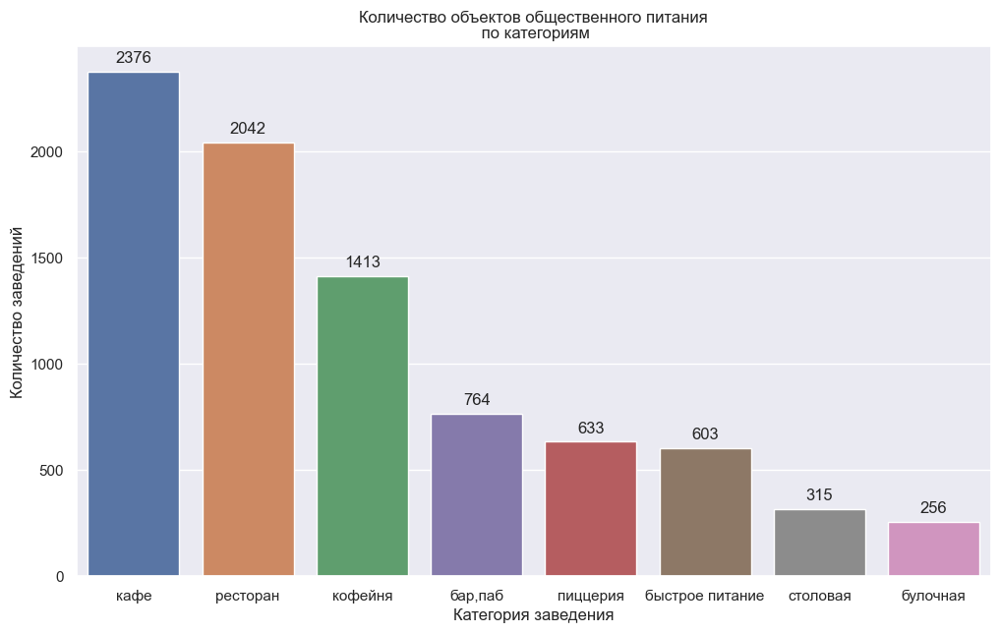

In [29]:
# построим countplot
ax = sns.countplot(
   data = data,
   x = data['category'],
   hue = 'category',
   order = data['category'].value_counts().index
)


for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), \
                (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', \
                va = 'center', xytext = (0, 10), textcoords = 'offset points')
 
    
# установим названия графика и осей
ax.set_title('Количество объектов общественного питания\n по категориям')
ax.set_xlabel('Категория заведения')
ax.set_ylabel('Количество заведений') 

plt.show()

/var/folders/bw/9z2dh6pd1w10bv3kg9h4mr0m0000gn/T/ipykernel_30133/3166325070.py:18: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=0)


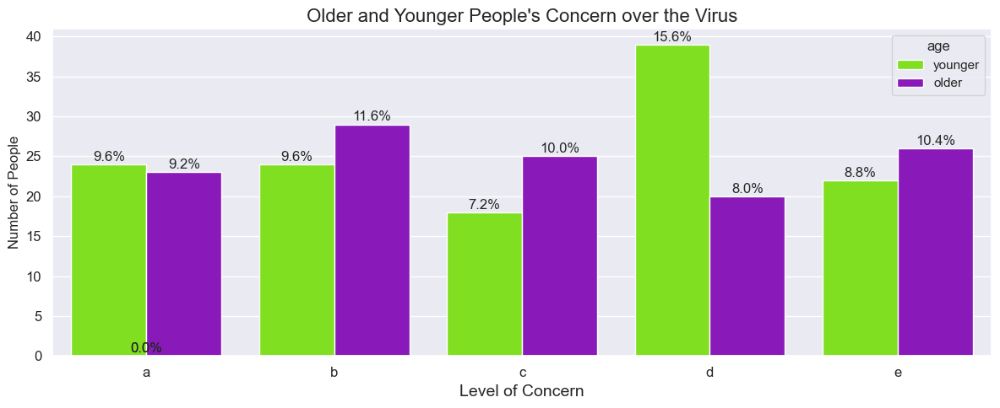

In [30]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

N = 250
df_x_1 = pd.DataFrame({'concern_virus': np.random.choice(['a', 'b', 'c', 'd', 'e'], N),
                       'age': np.random.choice(['younger', 'older'], N)})
plt.figure(figsize=(12, 5))
ax = sns.countplot(data=df_x_1, x='concern_virus', order=['a', 'b', 'c', 'd', 'e'],
                   hue='age', hue_order=['younger', 'older'],
                   palette=['chartreuse', 'darkviolet'])
plt.xticks(size=12)
plt.xlabel('Level of Concern', size=14)
plt.yticks(size=12)
plt.ylabel('Number of People', size=12)
plt.title("Older and Younger People's Concern over the Virus", size=16)
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)

total = len(df_x_1)
for p in ax.patches:
    percentage = f'{100 * p.get_height() / total:.1f}%\n'
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='center')
plt.tight_layout()
plt.show()

### Исследуем количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Построим визуализации. Проанализируем результаты и сделаем выводы

In [31]:
# выведем информацию о столбце seats
# data['seats'].info()

In [32]:
# check
data[['seats']].info()

<class 'pandas.core.frame.DataFrame'>
Index: 8402 entries, 0 to 8405
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   seats   4792 non-null   float64
dtypes: float64(1)
memory usage: 131.3 KB


Видно, что столбец `seats` содержит много пропусков, а также тип данных float.\
Заполнить данные, к сожалению, мы не сможем, так как это приведет только к ошибочным заключениям, но тип данных изменим на integer. Так как в данных содержатся пропуски, изначально потребуется их заполнить, чтобы изменить тип данных.

In [33]:
# проверим сможем ли мы заполнить Nan на 0 (ноль)
data[data['seats'] == 0].head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
84,meat doner kebab,булочная,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0,улица лескова,True
177,арамье,булочная,"москва, улица 800-летия москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0,улица 800-летия москвы,False
196,донер-шашлык,ресторан,"москва, улица лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0,улица лескова,True


Мы узнали, что есть заведения, где нет посадочных мест, то есть равно нулю. Соотвественно, заполним пустые значения -1, заменим тип данных на int и сделаем срез по данным для построения графика.

In [34]:
# заполним пропуски значением -1
data['seats'] = data['seats'].fillna(-1)

In [35]:
# изменим тип данных на int
data['seats'] = data['seats'].astype(int)

# проверим тип данных столбца `seats`
data[['seats']].info()

<class 'pandas.core.frame.DataFrame'>
Index: 8402 entries, 0 to 8405
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   seats   8402 non-null   int64
dtypes: int64(1)
memory usage: 131.3 KB


In [36]:
seats_query = data.query('seats > -1')
seats_query['seats'].describe()

count    4792.000000
mean      108.361436
std       122.841130
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

В результате мы получили данные для построения графика.\
Всего в полученной таблице содержится информация о **4 792** заведениях. Максимальное количество посадочных мест - **1 288**, минимальное количество посадочных мест - **0**.
Исследуем количество посадочных мест в местах по категориям.

In [37]:
seats_query.groupby('category').agg({'seats': 'describe'}).reset_index()

category   seats                                                  \
                     count        mean         std  min   25%   50%    75%   
0          бар,паб   467.0  124.477516  145.162278  0.0  48.0  82.0  148.5   
1         булочная   148.0   89.385135   97.685844  0.0  25.0  50.0  120.0   
2  быстрое питание   349.0   98.891117  106.611739  0.0  28.0  65.0  140.0   
3             кафе  1217.0   97.365653  117.922464  0.0  35.0  60.0  120.0   
4          кофейня   751.0  111.199734  127.837772  0.0  40.0  80.0  144.0   
5         пиццерия   427.0   94.496487  112.282703  0.0  30.0  55.0  120.0   
6         ресторан  1269.0  121.892041  123.792216  0.0  48.0  86.0  150.0   
7         столовая   164.0   99.750000  122.951453  0.0  40.0  75.5  117.0   

           
      max  
0  1288.0  
1   625.0  
2  1040.0  
3  1288.0  
4  1288.0  
5  1288.0  
6  1288.0  
7  1200.0

**Рассмотрим данные подробнее:**

У всех категорий заведений минимальное количество посадочных мест - ноль. Объяснить отсутствие мест в заведении непросто, но предположительно это могло случиться по причине технической ошибки при выгрузки данных или формировании БД, или все эти заведения нацелены на быстрое обслуживание посетителей, могут работать круглосуточно, но при этом экономят на аренде.

In [38]:
# посмотрим кол-во заведений, которые имеют 0 посадочных мест
seats_query[seats_query['seats'] == 0]['category'].value_counts()

category
кафе               44
кофейня            24
ресторан           20
быстрое питание    18
булочная           11
пиццерия           10
столовая            5
бар,паб             4
Name: count, dtype: int64

Мы выяснили, что максмиальное количество мест в заведении по всем данные - **1 288**. Удивительный феномен, но такое количество мест почти у каждой категории заведения, кроме *быстрого питания*, *столовой* и *булочной*.

In [39]:
median_values = seats_query.groupby('category')['seats'].median().sort_values(ascending=False)

# отсортируем исходные данные по медианным значениям
sorted_seats_query = seats_query.set_index('category').loc[median_values.index].reset_index()

# создим график с отсортированными категориями
fig = px.box(
    sorted_seats_query,
    x='category',
    y='seats',
    title='Распределение посадочных мест по категориям',
    template='plotly',
    color='category',
    height=500,
    width=1100
)

fig.update_yaxes(range=[0, 400])
fig.update_layout(
    xaxis_title='Категория',
    yaxis_title='Количество посадочных мест'
)

fig.show()

По результатам визуализации данных мы налюдаем:
* Нижняя граница каждой категории заведений на нулевом значении;
* Верхняя граница каждой категории заведений в среднем у 300 посадочных мест;
* В зависимости от категории медианные значения находятся в промежутке от 50 до 86;
* Почти во всех категориях заведений максимальный выброс - 1 288 мест, что вызывает сомнения в правдоподобности данных, так как такое кол-во мест редко встретишь.

### Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете и выясним каких заведений больше

In [40]:
# посмотрим кол-во заведений в разбивке по сетевым и несетевым
chain_query = data['chain']\
.map({0:'несетевое',1:'сетевое'})\
.value_counts().reset_index()\
.rename(columns={'count':'quantity'})
chain_query

,chain,quantity
0,несетевое,5199
1,сетевое,3203


In [41]:
fig = px.bar(chain_query , 
             x='chain', 
             y= 'quantity',
             title = 'Количество сетевых и несетевых заведений', 
             template = 'plotly',
             text_auto=True,
             height = 500,
             width = 1100
            )
fig.update_layout(xaxis_title = 'Категория заведения',
                  yaxis_title = 'Количество заведений')

fig.show()

Очевидно, что несетевых заведений больше, чем сетевых.

### Категории заведений, которые чаще являются сетевыми. Исследуем данные и визуализируем

In [42]:
chain_query_by_category = data.pivot_table(
    index='category',
    columns='chain',
    values='name',
    aggfunc='count'
).reset_index().rename(columns={0:'not_chain',1:'chain'})

# создадим столбцы для расчета доли сетевых заведений от общего количества заведений
chain_query_by_category['sum'] = chain_query_by_category['not_chain'] + chain_query_by_category['chain']
chain_query_by_category['chain_ratio'] = round((chain_query_by_category['chain'] * 100) / chain_query_by_category['sum'],1)

chain_query_by_category = chain_query_by_category.sort_values(by='chain_ratio', ascending=False).reset_index(drop=True)
chain_query_by_category

chain,category,not_chain,chain,sum,chain_ratio
0,булочная,99,157,256,61.3
1,пиццерия,303,330,633,52.1
2,кофейня,693,720,1413,51.0
3,быстрое питание,371,232,603,38.5
4,ресторан,1313,729,2042,35.7
5,кафе,1597,779,2376,32.8
6,столовая,227,88,315,27.9
7,"бар,паб",596,168,764,22.0


In [43]:
fig = px.bar(chain_query_by_category,
             x='category',
             y= 'chain_ratio',
             title = 'Количество заведений в Москве по категориям',
             template = 'plotly',
             text_auto=True,
             height = 500,
             width = 1100
            )
fig.update_layout(xaxis_title = 'Категория заведения',
                  yaxis_title = 'Доля заведений,%'
                 )

fig.show()

In [44]:
#fig = chain_query_by_category.plot(x = 'category', y = 'chain_ratio', kind='bar')
#plt.title('Количество сетевых и несетевых заведений\n в разрезе типа заведения')
#plt.ylabel('Доля')
#plt.xlabel('Тип объекта')
#plt.xticks(rotation=0)
#plt.figure(figsize=(12,7))
#fig.bar_label(fig.containers[0], label_type='edge')

#plt.show();

Отвечая на вопрос какие категории заведений чаще являются сетевыми, в Москве выделяются следующие категории:
1. Булочная
2. Пиццерия
3. Кофейня

### Сгруппируем данные по названиям заведений и найдём топ-15 популярных сетей в Москве. Построим столбчатую диаграмму и исследуем данные

In [45]:
# выведем топ 15 сетевых заведений
top_15 = data[['name','category','address','chain']].query(
    'chain == 1' # сделаем срез по сетевым заведениям
).groupby( # сгруппируем данные по наименованию и категории заведения
    ['name']
).agg(
    {'category':'first','address':'count'} # агрегируем по адресу
).rename(columns={'address':'quantity'}).sort_values( # отсортируем по убыванию значений
    by=['quantity'],
    ascending=False,
    inplace=False
).reset_index().head(15)
top_15

,name,category,quantity
0,шоколадница,кофейня,120
1,домино'с пицца,пиццерия,76
2,додо пицца,пиццерия,74
3,one price coffee,кофейня,71
4,яндекс лавка,ресторан,69
5,cofix,кофейня,65
6,prime,ресторан,50
7,хинкальная,быстрое питание,44
8,кофепорт,кофейня,42
9,кулинарная лавка братьев караваевых,кафе,39


По результатам можно заметить, что больше всего сетевых заведений у Шоколадницы.\
2-е и 3-е места занимают известные пиццерии - Доминос`с пицца и Додо пицца, а наименьшее количество заведений в топ-15 сетевых заведений относится к сети Му-Му.

In [46]:
# создадим датафрейм в разбивке по категориям топ 15 сетевых заведений 
top_15_category = top_15\
.groupby('category').agg({'quantity':'sum'})\
.reset_index().sort_values(by='quantity', ascending=False).reset_index(drop=True)

# создадим столбец доли сетевого заведений от общего числа звадений по категориям
top_15_category['ratio'] = round((top_15_category['quantity'] * 100) / top_15_category['quantity'].sum(),1)
top_15_category

,category,quantity,ratio
0,кофейня,330,40.4
1,ресторан,157,19.2
2,пиццерия,150,18.4
3,кафе,103,12.6
4,быстрое питание,44,5.4
5,булочная,32,3.9


После группировки данных по категориям видно, что чаще всего сетевыми заведениями являются кофейни, рестораны и пиццерии.

Визуализируем данные. Наиболее подходящий вариант визуализации: **столбчатая диаграмма**.

In [47]:
fig = px.bar(top_15_category,
             x='category',
             y= 'ratio',
             title = 'Количество точек у крупных сетевиков Москвы',
             template = 'plotly',
             text_auto=True,
             height = 500,
             width = 1100
            )
fig.update_layout(xaxis_title = 'Категория сетевого заведения',
                 yaxis_title = 'Доля,%')
fig.update_traces(hovertemplate = 'Категория сетевого заведения : %{x} <br>Количество: %{y}')

fig.show()

Из визуализации мы видим, что от топ-15 сетевых заведений доля кофеен составляет 40%. Далее располагается ресторан и пиццерия. 

В топ-15 сетевых заведений попали известные заведения по всей России.

Заведения, которые вошли в топ-15 сетевых, объединяют категории заведений.

В целом, наиболее популярные сетевые заведения относятся к категориям:
* Кофейня
* Пиццерия
* Ресторан

### Отобразим общее количество заведений и количество заведений каждой категории по районам. Проиллюстрируем эту информацию графиком

In [48]:
# выведем общее количество заведений по регионам
data.district.value_counts()

district
Центральный административный округ         2242
Северный административный округ             898
Южный административный округ                892
Северо-Восточный административный округ     890
Западный административный округ             850
Восточный административный округ            798
Юго-Восточный административный округ        714
Юго-Западный административный округ         709
Северо-Западный административный округ      409
Name: count, dtype: int64

На этапе открытия данных мы выяснили, что Заведения располагаются в 9 районах Москвы ньаибольшее количество заведений находится в Центральном АО Москвы - 2.242 заведения, а меньше всего находится в Северо-Западном АО Москвы - 409 заведений.

Рассмотрим количество заведений в разрезе категорий и административных округов.

In [49]:
# создадим таблицу с разбивкой по округам и категориям
dist_categ_df = data\
.groupby(['district', 'category'])\
.agg({'address':'count'})\
.sort_values('address', ascending=True).reset_index()\
.rename(columns={'address':'quantity'})\

dist_categ_df

,district,category,quantity
0,Северо-Западный административный округ,булочная,12
1,Юго-Восточный административный округ,булочная,13
2,Юго-Западный административный округ,столовая,17
3,Северо-Западный административный округ,столовая,18
4,Северо-Западный административный округ,"бар,паб",23
...,...,...,...
67,Юго-Восточный административный округ,кафе,282
68,Центральный административный округ,"бар,паб",364
69,Центральный административный округ,кофейня,428
70,Центральный административный округ,кафе,464


In [50]:
fig = px.bar(dist_categ_df.sort_values('quantity',ascending=True),
             y='district',
             x= 'quantity',
             title = 'Количество заведений в АО Москвы по категориям',
             template = 'plotly',
             color='category',
             orientation='h',
             height = 500,
             width = 1110
            )
            
fig.update_layout(yaxis_title = 'Наименование административного округа',
                  xaxis_title = 'Количество заведений',
                  yaxis={'categoryorder':'total ascending'}
                     )

fig.show()

Построим отдельно график в относительных значениях из-за большого отличия в количестве заведений между ЦАО и остальными округами.

In [51]:
dist_categ_df['ratio'] = dist_categ_df.groupby('district')['quantity'].transform(lambda x: x / x.sum() * 100).round(2)
dist_categ_df['district_short'] = dist_categ_df['district'].replace({
    'Восточный административный округ':'ВАО',
    'Западный административный округ':'ЗАО',
    'Центральный административный округ':'ЦАО',
    'Северный административный округ':'САО',
    'Северо-Восточный административный округ':'СВАО',
    'Юго-Западный административный округ':'ЮЗАО',
    'Южный административный округ':'ЮАО',
    'Юго-Восточный административный округ':'ЮВАО',
    'Северо-Западный административный округ':'СЗАО'
})

dist_categ_df.head(15)

,district,category,quantity,ratio,district_short
0,Северо-Западный административный округ,булочная,12,2.93,СЗАО
1,Юго-Восточный административный округ,булочная,13,1.82,ЮВАО
2,Юго-Западный административный округ,столовая,17,2.40,ЮЗАО
3,Северо-Западный административный округ,столовая,18,4.40,СЗАО
4,Северо-Западный административный округ,"бар,паб",23,5.62,СЗАО
5,Западный административный округ,столовая,24,2.82,ЗАО
6,Восточный административный округ,булочная,25,3.13,ВАО
7,Южный административный округ,булочная,25,2.80,ЮАО
8,Юго-Восточный административный округ,столовая,25,3.50,ЮВАО
9,Юго-Западный административный округ,булочная,27,3.81,ЮЗАО


In [52]:
fig = px.bar(dist_categ_df.sort_values('ratio', ascending=False),
             x= 'ratio',
             y='district_short',
             title = 'Количество заведений в АО Москвы по категориям',
             template = 'plotly',
             color='category',
             orientation='h',
             height = 500,
             width = 1100,
             text_auto=True,
             labels={'ratio': 'Доля', 'district_short': 'Округ', 'category': 'Категория заведений'}
            )
fig.update_layout(yaxis_title = 'Наименование административного округа',
                  xaxis_title = 'Доля заведений',
                  barmode='stack', xaxis={'categoryorder': 'total descending'}   
                 )
fig.show()

Почти в каждом округе распределение заведений по категориям одинаковое за исключением ЦАО.\
В Центральном административном округе преобладают рестораны, а далее в порядке убывания кафе, кофейни и бары.\
В остальных округах больше всего располагается кафе, затем рестораны и кофейни.

### Визуализируем распределение средних рейтингов по категориям заведений и выясним сильно ли различаются усреднённые рейтинги в разных типах общепита

In [53]:
data.groupby('category').agg({'rating':'describe'})

rating                                             
                  count      mean       std  min  25%  50%  75%  max
category                                                            
бар,паб           764.0  4.387696  0.380392  1.1  4.3  4.4  4.6  5.0
булочная          256.0  4.268359  0.386303  1.3  4.2  4.3  4.4  5.0
быстрое питание   603.0  4.050249  0.560949  1.1  3.9  4.2  4.3  5.0
кафе             2376.0  4.124285  0.566001  1.0  4.0  4.2  4.4  5.0
кофейня          1413.0  4.277282  0.372250  1.4  4.1  4.3  4.4  5.0
пиццерия          633.0  4.301264  0.336162  1.0  4.2  4.3  4.4  5.0
ресторан         2042.0  4.290402  0.413143  1.0  4.2  4.3  4.5  5.0
столовая          315.0  4.211429  0.454205  1.0  4.1  4.3  4.4  5.0

In [54]:
fig = px.box(data,
             y = 'rating',
             x = 'category',
             title = 'Рейтинг заведений по категориям',
             template = 'plotly',
             color = 'category',
             height = 500,
             width = 1100,
             category_orders={'category': data.groupby(by=['category'])['rating'] \
                                                     .median() \
                                                     .sort_values(ascending=False)\
                                                     .index.to_list()}
            )
fig.update_layout(xaxis_title = 'Категория заведения',
                  yaxis_title = 'Рейтинг категории заведения')

Из выведенных данных и визуализации можно сделать следующие выводы:
* У каждой категории заведений медианное значение от 4,2 звезд до 4,5 звезд. В целом, средние оценки каждой категории заведения на высоком уровне.
* У категорий заведения бар,паб и кафе размах боксплота доходит значения 5, а у остальных категорий заведений 5 звезд - это выброс, что говорит о редкости 5-тизначной оценки заведения у этих категории;
* У категорий заведения кафе и быстрое питание нижняя граница размаха 3.3 - 3.4 звезды, у остальных категорий нижняя граница в среднем около 4 звёзд;
* Больше всего выбросов с негативными оценками заведения у категорий: кафе, ресторан и быстрое питание.

### Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района

In [55]:
# создадим датафрейм со средним рейтингом заведений каждого района
rating_df = data.groupby('district', as_index=False)['rating'].agg('mean').round(2)\
.sort_values('rating',ascending=False)\
.reset_index(drop=True)

rating_df

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [56]:
# читаем файл и сохраняем в переменной
try: 
     with open('/Users/bis.partnermail.ru/Desktop/Яндекс Практикум/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
         geo_json = json.load(f)    
except:
    with open('/datasets/admin_level_geomap.geojson', 'r', encoding='utf-8') as f:
        geo_json = json.load(f)

In [57]:
# загружаем JSON-файл с границами округов Москвы
try:
    state_geo = '/Users/bis.partnermail.ru/Desktop/Яндекс Практикум/datasets/admin_level_geomap.geojson'
except:
    state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_df,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам'
).add_to(m)

# выводим карту
m

Благодаря хороплету мы видим, что в ЦАО самый высокий средний рейтинг заведений. Хуже дела обстоят у Юго-Восточного АО и Северо-Восточного АО, средний рейтинг у заведений в этих округах ниже, чем в остальных.

### Отобразим все заведения датасета на карте с помощью кластеров средствами библиотеки `folium`

In [58]:
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    # сохраняем URL-адрес изображения со значком торгового центра с icons8,
    # это путь к файлу на сервере icons8
    icon_url = 'https://img.icons8.com/ios/256/restaurant-building.png'  
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    # создаём маркер с иконкой icon и добавляем его в кластер
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию для создания кластеров к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Благодаря кластерам мы сможем снизить нагрузку на график и увидеть расположение всех заведений в Москве.\
На карте видно, что основное скопление заведений приходится на Центральный АО. Чем ближе к МКАДу, тем меньше заведений встречается.

### Найдём топ-15 улиц по количеству заведений и построим график распределения количества заведений и их категорий по этим улицам

In [59]:
top_15_streets = data.groupby('street')\
.agg({'street':'count'})\
.rename(columns={'street':'Quantity'})\
.sort_values('Quantity', ascending=False).reset_index().head(15)

top_15_streets = top_15_streets.rename(columns={'street':'Street_name'})
top_15_streets

,Street_name,Quantity
0,проспект мира,183
1,профсоюзная улица,122
2,проспект вернадского,108
3,ленинский проспект,107
4,ленинградский проспект,95
5,дмитровское шоссе,88
6,каширское шоссе,77
7,варшавское шоссе,75
8,ленинградское шоссе,69
9,люблинская улица,60


In [60]:
fig = px.bar(top_15_streets, 
             x= 'Street_name',
             y='Quantity',
             title = 'Топ 15 улиц по количеству заведений',
             template = 'plotly',
             text_auto=True,
             height = 500,
             width = 1100)
fig.update_layout(xaxis_title = 'Название улицы',
                 yaxis_title = 'Количество заведений')
fig.update_traces(hovertemplate = 'Название Улицы : %{x} <br>Количество: %{y}')

fig.show()

Создадим отдельный датафрейм, где будут находиться данные на заведения только с вышеперечисленных улиц.

In [61]:
top_streets = top_15_streets['Street_name'].tolist()
top_15_streets_df = data.query("street in @top_streets")

#проверим, правильно ли перенеслись данные
top_15_streets_df.street.unique()

array(['дмитровское шоссе', 'ленинградское шоссе', 'алтуфьевское шоссе',
       'проспект мира', 'ленинградский проспект', 'кутузовский проспект',
       'ленинский проспект', 'пятницкая улица', 'проспект вернадского',
       'улица вавилова', 'профсоюзная улица', 'люблинская улица',
       'улица миклухо-маклая', 'варшавское шоссе', 'каширское шоссе'],
      dtype=object)

In [62]:
top_st_category = top_15_streets_df\
.groupby(['street','category'], as_index=False)['name']\
.agg('count').rename(columns={'street':'Street_name','category':'Category','name':'Quantity'})

top_st_category

,Street_name,Category,Quantity
0,алтуфьевское шоссе,"бар,паб",5
1,алтуфьевское шоссе,булочная,1
2,алтуфьевское шоссе,быстрое питание,5
3,алтуфьевское шоссе,кафе,13
4,алтуфьевское шоссе,кофейня,9
...,...,...,...
108,улица миклухо-маклая,быстрое питание,4
109,улица миклухо-маклая,кафе,21
110,улица миклухо-маклая,кофейня,4
111,улица миклухо-маклая,пиццерия,2


In [63]:
fig = px.bar(top_st_category,
             x='Quantity',
             y='Street_name',
             title = 'Количество заведений по категориям\nна топ-15 улицах',
             template = 'plotly',
             color='Category',
             barmode='stack',
             height = 500,
             width = 1100,
             text_auto=True
            )
fig.update_layout(yaxis_title = 'Наименование улицы',
                  xaxis_title = 'Количество заведений',
                 yaxis={'categoryorder':'total ascending'})
fig.show()

Больше всего на топ-15 улицах по количеству заведений в разбивке по категориям - ресторан, кафе, кофейни.\
Меньше всего на топ-15 улицах по количеству заведений в разбивке по категориям - столовых и булочных.\
\
Стоит отметить, что чем длиннее улица, тем больше заведений располагается на нем. Предположительно, чем больше протяженность улицы, тем больше располагается на ней заведений.

### Найдём улицы, на которых находится только один объект общепита

In [64]:
# отберем улицы, на которых расположено только одно заведение
# one_place = data['street'].value_counts().to_frame().reset_index().rename(columns={'street':'street_name' ,'count':'quantity'}).query('quantity == 1')
one_place = data['street']\
.value_counts().to_frame()\
.reset_index().rename(columns={'street':'street_name' ,'count':'quantity'}).query('quantity == 1').reset_index(drop=True)
one_place

,street_name,quantity
0,симферопольский проезд,1
1,улица юннатов,1
2,миусская площадь,1
3,красностуденческий проезд,1
4,2-й лучевой просек,1
...,...,...
429,молдавская улица,1
430,полоцкая улица,1
431,улица демьяна бедного,1
432,улица неверовского,1


Итого, в данных содержится 434 улицы, которые распологают только 1 заведение.

In [65]:
# создадим лист с наименованиями улиц
one_place = one_place.street_name.tolist()

In [66]:
# выберем строки из основной таблицы, используя созданный лист
# сгруппируем данные по категориям
one_place_df = data.query('street in @one_place')\
.groupby('category')\
.agg({'name':'count'}).\
rename(columns={'name':'count'}).reset_index().sort_values(by = 'count' ,ascending=False)

one_place_df.head()

,category,count
3,кафе,149
6,ресторан,90
4,кофейня,78
0,"бар,паб",40
7,столовая,36


In [67]:
fig = px.bar(one_place_df,
             x='category',
             y='count',
             template='plotly',                   
             color='category',
             height = 500,
             width = 1100,
             text_auto=True
            )
# оформляем график
fig.update_layout(title='Количество заведений в разрезе категорий',
                   xaxis_title='Категория заведения',
                   yaxis_title='Количество заведений',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

In [68]:
# сгруппируем данные по округам
one_place_df_ao = data.query('street in @one_place')\
.groupby('district')\
.agg({'name':'count'}).\
rename(columns={'name':'count'}).sort_values(by = 'count' ,ascending=False).reset_index()

one_place_df_ao['district_short'] = one_place_df_ao['district'].replace({
    'Восточный административный округ':'ВАО',
    'Западный административный округ':'ЗАО',
    'Центральный административный округ':'ЦАО',
    'Северный административный округ':'САО',
    'Северо-Восточный административный округ':'СВАО',
    'Юго-Западный административный округ':'ЮЗАО',
    'Южный административный округ':'ЮАО',
    'Юго-Восточный административный округ':'ЮВАО',
    'Северо-Западный административный округ':'СЗАО'
})
# изменим порядок столбцов
one_place_df_ao[['district','district_short','count']]


,district,district_short,count
0,Центральный административный округ,ЦАО,136
1,Восточный административный округ,ВАО,54
2,Северо-Восточный административный округ,СВАО,49
3,Северный административный округ,САО,48
4,Западный административный округ,ЗАО,37
5,Южный административный округ,ЮАО,37
6,Юго-Восточный административный округ,ЮВАО,36
7,Северо-Западный административный округ,СЗАО,19
8,Юго-Западный административный округ,ЮЗАО,18


In [69]:
fig = px.bar(one_place_df_ao,
             x='district_short', 
             y='count', 
             title = 'Количество заведений в разрезе АО на улицах с одним заведением общепита', 
             template = 'plotly',
             color='district', 
             barmode='stack',
             height = 500,
             width = 1100,
             text_auto=True
            )
fig.update_layout(yaxis_title = 'Наименование АО',
                  xaxis_title = 'Количество заведений',
                 yaxis={'categoryorder':'total ascending'})
fig.show()

Удалось обнаружить 434 улицы, на которых расположено всего одно заведение.\
В разрезе по категориям заведений наибольшее число объектов общепита относится к кафе, ресторану и кофейне. Булочных меньше всего.\
В разерезе по автономным окргугам больше всего заведений находится в ЦАО, а меньше всего заведений находится в Северо-Западном АО и Юго-Западном АО.

Дополнительно рассмотрим заведения, которые расположены на улицах только с одиним объектом общепита.

In [70]:
# отобразим эти заведения на карте
moscow_lat, moscow_lng = 55.751244, 37.618423
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    # сохраняем URL-адрес изображения со значком торгового центра с icons8,
    # это путь к файлу на сервере icons8
    icon_url = 'https://img.icons8.com/?size=100&id=611&format=png&color=000000'  
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30))
    
    # создаём маркер с иконкой icon и добавляем его в кластер
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
        icon=icon,
    ).add_to(marker_cluster)

# применяем функцию для создания кластеров к каждой строке датафрейма
data.query('street in @one_place').apply(create_clusters, axis=1)

# выводим карту
m

При помощи картографической визуализации удалось выяснить, что заведения располагаются ближе к центру.\
Чем ближе к МКАДу, тем меньше становится становится заведений.

### Посчитаем медиану столбца `middle_avg_bill` для каждого района. Используем это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района и проанализируем цены в ЦАО и других регионах

In [71]:
# отберем данные по среднему чеку без нулевых значений
middle_avg_bill = data.query('middle_avg_bill.notnull()')
middle_avg_bill.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,клязьминская улица,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,правобережная улица,False


In [72]:
distr_mid_avg_bill = middle_avg_bill\
.groupby('district')\
.agg({'middle_avg_bill':'median'})\
.rename(columns={'middle_avg_bill':'median'})\
.sort_values(by = 'median' ,ascending=False).round(1).reset_index()
distr_mid_avg_bill

,district,median
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [73]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=distr_mid_avg_bill,
    columns=['district', 'median'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name="Средний рейтинг заведений по районам"
).add_to(m)

m

Из приведенных данных можно сделать вывод, что Центральный АО и Западный АО имеют наибольший средний чек.\
Наименьший средний чек у Северо-Восточного АО, Юго-Восточного АО и Южного АО.

### Вывод

**Анализ данных показал, что:**
* Больше всего заведений на рынке относятся к категориям: кафе, ресторан и кофейня;
* Нижняя граница каждой категории заведений - 0 мест, верхняя граница - 300 посадочных мест;
* В среднем количество посадочных мест по категориям заведений находится в промежутке от 50 до 86;
* Максимальное количество мест в заведении - 1 288, что вызывает сомнения в правдоподобности данных, так как такое кол-во мест редко встретишь;
* Несетевых заведений больше, чем сетевых. Чаще всего сетевыми заведениями являются кафе, кофейни и рестораны;
* В топ-15 сетевых заведений попали известные заведения по всей России (Шоколадница, Доминос'с пицца, Додо пицца и т.д.).\
Категории топ-15 заведений разные. Какие-то относятся к пицце, какие-то к кофе, а кто-то ориентируется на более обширный спектр товаров. Например, Яндекс.Лавка, Теремок, Prime.
В целом, наиболее популярные сетевые заведения относятся к категориям: кофейня, пиццерия и ресторан;
* Почти в каждом округе распределение заведений по категориям одинаковое за исключением ЦАО.\
В Центральном АО преобладают рестораны, а далее в порядке убывания кафе, кофейни и бары.\
В остальных округах больше всего располагается кафе, затем рестораны и кофейни.
* Медианное значение рейтинга по всем категориям заведений от 4,2 звезд до 4,5 звезд. В целом, средние оценки каждой категории заведения на высоком уровне.\
У категорий заведения кафе и быстрое питание нижняя граница размаха 3.3 - 3.4 звезды, у остальных категорий нижняя граница в среднем около 4 звёзд.\
Больше всего выбросов с негативными оценками заведения у категорий: кафе, ресторан и быстрое питание.
* В Центральном округе самый высокий средний рейтинг заведений. Хуже дела обстоят у Юго-Восточного АО и Северо-Восточного АО, медианный рейтинг у заведений в этих округах ниже, чем в остальных.
* Больше всего на топ-15 улицах по количеству заведений в разбивке по категориям - ресторан, кафе, кофейни.
Меньше всего на топ-15 улицах по количеству заведений в разбивке по категориям - столовых и булочных.
* Всего в данных находится 434 улицы, на которых расположено всего одно заведение.
В разрезе по категориям заведений наибольшее число объектов общепита относится к кафе, ресторану и кофейне. Булочных меньше всего.
В разерезе по автономным окргугам больше всего заведений находится в ЦАО, а меньше всего заведений находится в Северо-Западном АО и Юго-Западном АО.
* Наибольший средний чек в заведениях ЦАО и ЗАО.
Наименьший средний чек в заведениях СВАО, ЮВАО и ЮАО.

## Открытие кофейни

Ответим на вопросы Заказчика и попробуем определить, может ли исполнится мечта клиентов. 

### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [74]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"москва, улица дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,-1,улица дыбенко,False
1,четыре комнаты,ресторан,"москва, улица дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4,улица дыбенко,False
2,хазри,кафе,"москва, клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45,клязьминская улица,False
3,dormouse coffee shop,кофейня,"москва, улица маршала федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,-1,улица маршала федоренко,False
4,иль марко,пиццерия,"москва, правобережная улица, 1б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148,правобережная улица,False


In [75]:
coffee_shops = data.query('category == "кофейня"')
coffee_shops.info()
print(f'Всего кофеен в датасете: {coffee_shops.name.count()}')

<class 'pandas.core.frame.DataFrame'>
Index: 1413 entries, 3 to 8400
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               1413 non-null   object 
 1   category           1413 non-null   object 
 2   address            1413 non-null   object 
 3   district           1413 non-null   object 
 4   hours              1413 non-null   object 
 5   lat                1413 non-null   float64
 6   lng                1413 non-null   float64
 7   rating             1413 non-null   float64
 8   price              476 non-null    object 
 9   avg_bill           721 non-null    object 
 10  middle_avg_bill    200 non-null    float64
 11  middle_coffee_cup  521 non-null    float64
 12  chain              1413 non-null   int64  
 13  seats              1413 non-null   int64  
 14  street             1384 non-null   object 
 15  is_24_7            1413 non-null   bool   
dtypes: bool(1), float64(5), int64

In [76]:
coffee_shops_pivot = coffee_shops\
.groupby('district')\
.agg({'name':'count'})\
.reset_index()\
.sort_values(by='name', ascending=False).reset_index(drop=True)\
.rename(columns={'name':'quantity'})
coffee_shops_pivot['ratio'] = round((coffee_shops_pivot['quantity'] * 100) / sum(coffee_shops_pivot['quantity']),2)
coffee_shops_pivot['district_short'] = coffee_shops_pivot['district'].replace({
    'Восточный административный округ':'ВАО',
    'Западный административный округ':'ЗАО',
    'Центральный административный округ':'ЦАО',
    'Северный административный округ':'САО',
    'Северо-Восточный административный округ':'СВАО',
    'Юго-Западный административный округ':'ЮЗАО',
    'Южный административный округ':'ЮАО',
    'Юго-Восточный административный округ':'ЮВАО',
    'Северо-Западный административный округ':'СЗАО'
})
coffee_shops_pivot[['district','district_short','quantity','ratio']]

,district,district_short,quantity,ratio
0,Центральный административный округ,ЦАО,428,30.29
1,Северный административный округ,САО,193,13.66
2,Северо-Восточный административный округ,СВАО,159,11.25
3,Западный административный округ,ЗАО,150,10.62
4,Южный административный округ,ЮАО,131,9.27
5,Восточный административный округ,ВАО,105,7.43
6,Юго-Западный административный округ,ЮЗАО,96,6.79
7,Юго-Восточный административный округ,ЮВАО,89,6.30
8,Северо-Западный административный округ,СЗАО,62,4.39


In [77]:
fig = px.bar(coffee_shops_pivot,
             x='district_short', 
             y='quantity', 
             title = 'Количество кофеен в разрезе АО', 
             template = 'plotly',
             color='district',
             barmode='stack',
             height = 500,
             width = 1100,
             text_auto=True
            )
fig.update_layout(yaxis_title = 'Наименование АО',
                  xaxis_title = 'Количество кофеен',
                  yaxis={'categoryorder':'total ascending'})
fig.show()

Больше всего кофеен располагается в Центральном АО (30,3% от всех кофеен в Москве). Меньше всего в Северо-Западном АО (4,4% от всех кофеен Москвы).

### Есть ли круглосуточные кофейни?

Посчитаем количество круглосуточных кофеен.

In [78]:
# предобрабатывая данные, мы сделали столбец is_24/7, который означает круглосуточную работу
# посмотрим сколько заведений работает круглосуточно
coffee_shops['is_24_7'].value_counts()

is_24_7
False    1354
True       59
Name: count, dtype: int64

In [79]:
# создадим датафрейм только с круглосуточными кофейнями
coffee_shops_24_7 = coffee_shops[coffee_shops['is_24_7'] == True]\
.groupby('name')\
.agg({'is_24_7':'count'})\
.reset_index()\
.rename(columns={'name':'Cafe_name', 'is_24_7':'Quantity'})\
.sort_values('Quantity', ascending=False)

# проверим размер датафрейма
coffee_shops_24_7.reset_index(drop=True)

,Cafe_name,Quantity
0,шоколадница,17
1,кофемания,8
2,wild bean cafe,6
3,wild bean,5
4,кофе хауз,3
5,кофе с собой,2
6,you&coffee,2
7,cofix,2
8,столица,1
9,пирог хауз,1


Всего некруглосуточных кофеен - `1354`. Соответсвенно, `59` кофеен работают круглосуточно.\
Больше всего круглосуточных заведений у сети "Шоколадница", на втором месте - "Кофемания", но круглосуточных заведений у "Кофемании" уже в 2 раза меньше, чем у "Шоколадницы".

In [80]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.query('hours == "ежедневно, круглосуточно" & category == "кофейня"').apply(create_clusters, axis=1)

# выводим карту
m

При помощи визуализации мы видим, что основная концентрация круглосуточных кофеен в Центральном и Юго-Западном округах. Чуть меньше (5-6 точек) располагается в Северо-Западном, Западном и Восточном округах. Меньше всего в Южном, Юго-Восточном и Северном округах (1-2 заведения).

### Какие у кофеен рейтинги? Как они распределяются по районам?

In [81]:
# выведем рейтинг кофеен по округам
coffee_shop_rate = data.query('category == "кофейня"')\
.groupby('district')\
.agg({'rating':'mean'})\
.rename(columns={'rating':'Avg_rate'})\
.sort_values('Avg_rate',ascending=False).reset_index()\

coffee_shop_rate

,district,Avg_rate
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


In [82]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_shop_rate,
    columns=['district', 'Avg_rate'],
    key_on='feature.name',
    fill_color='YlGn',
    legend_name='Средний рейтинг кофеен по районам Москвы',
).add_to(m)

# выводим карту
m

Средний рейтинг лучше всего в Центральном и Северо-Западном округах.\
Ниже всего рейтинг в Северо-Восточном и Западном административных округах.

### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [83]:
middle_price_coffee = data.\
groupby('district', as_index=False)['middle_coffee_cup'].\
agg('mean').round().\
sort_values('middle_coffee_cup', ascending=False)

# отобразим данные
display(middle_price_coffee.reset_index(drop=True))
# выведем среднюю стоимость чашки кофе в Москве
# print(f'Средняя стоимость чашки кофе в Москве: {middle_price_coffee['middle_coffee_cup'].mean().round()}')

,district,middle_coffee_cup
0,Западный административный округ,190.0
1,Центральный административный округ,188.0
2,Юго-Западный административный округ,183.0
3,Восточный административный округ,174.0
4,Северный административный округ,165.0
5,Северо-Восточный административный округ,165.0
6,Северо-Западный административный округ,160.0
7,Южный административный округ,158.0
8,Юго-Восточный административный округ,151.0


In [84]:
print(f'Средняя стоимость чашки кофе в Москве: {middle_price_coffee.middle_coffee_cup.mean().round()}')

Средняя стоимость чашки кофе в Москве: 170.0


In [85]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_price_coffee,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    legend_name='Средний цена чашки кофе по районам',
).add_to(m)

# выводим карту
m

В Центральном, Западном и Юго-Западном округах - самый дорогой кофе.\
Средняя стоимость кофе в этих округах составляет 180 рублей, в то время как в среднем по Москве цена за чашку кофе равна 170.\
Если открывать кафе, рекомендуется определить цену на кофе исходя из месторасположения, не превышая средней цены в этом районе.

In [86]:
data.query('category == "кофейня" & middle_coffee_cup > 250')\
.groupby('name').agg({'name':'count'}).rename(columns={'name':'cnt'})\
.reset_index().sort_values('cnt',ascending=False).head(10)

,name,cnt
31,шоколадница,55
10,"skuratov, coffee roasters",3
18,даблби,3
3,coffee bean,2
25,кофе хауз,2
29,собрание,1
28,па па кофе,1
27,кофейня на остоженке,1
26,кофе&moloko,1
17,гедонист,1


### Вывод
Из проведенного анализа, ответим на интересующие Заказчиков вопросы и дадим рекомендации:

Так как Заказчики не боятся большой конкуренции, рекомендуется открывать кофейню в Центральном, Западном или Юго-Западном округах.
* Несмотря на большую конкуренцию, спрос на кофе в этих округах выше, чем в других;
* В основном круглосуточные кофейни концетрируются в Центре и на Юго-Западе Москвы;
* Также в этих округах рейтинг заведений выше, чем в остальных и средний чек также выше среднего по Москве.

Менее рискованным округами для ведения бизнеса являются Западный и Юго-Западный. Средний чек чуть меньше в сравнении с заведениями в ЦАО, но спрос на кофейни также высок.\
Как вариант стоит рассмотреть данные округа для открытия кофейни, так как в перспективе бизнесы будут открываться в этом направлении. В Центральном районе расположено уже много заведений, что может помещать развитию нового заведения в уже состоявшейся бизнес-среде.

## Общий вывод


Был проведен анализ рынка заведений общественного питания г. Москвы.\
\
Мы исследовали количество объектов общественного питания по категориям и выяснили, что в данных всего 8 категорий заведений:
|Категория заведения|Количество заведений|
|:-|:-:|
|Кафе|2376|
|Ресторан|2042|
|Кофейня|1413|
|Бар,паб|764|
|Пиццерия|633|
|Быстрое питание|603|
|Столовая|315|
|Булочная|256|


Несетевых заведений в Москве больше, чем сетевых. При исследовании сетевых заведений удалось выяснить, что сетевыми завдениями являются крупные предприятия, которые в основном относятся к категории ресторан, кафе и кофейня. Эти сетевые заведения известны по всей стране.

Почти в каждом округе распределение заведений по категориям одинаковое за исключением ЦАО.\
В Центральном административном округе преобладают рестораны, а далее в порядке убывания кафе, кофейни и бары.
В остальных округах больше всего располагается кафе, затем рестораны и кофейни.

У каждой категории заведений медианное значение от 4,2 звезд до 4,5 звезд. В целом, средние оценки каждой категории заведения на высоком уровне.\
У категорий заведения `бар,паб` и `кафе` размах боксплота доходит значения 5, а у остальных категорий заведений 5 звезд - это выброс, что говорит о редкости 5-ти значной оценки заведения у этих категории.\
У категорий заведения `кафе` и `быстрое питание` нижняя граница размаха 3.3 - 3.4 звезды, у остальных категорий нижняя граница в среднем около 4 звёзд.\
Больше всего выбросов с негативными оценками заведения у категорий: `кафе`, `ресторан` и `быстрое питание`.

Больше всего на топ-15 улицах по количеству заведений в разбивке по категориям - `ресторан`, `кафе`, `кофейни`.\
Меньше всего на топ-15 улицах по количеству заведений в разбивке по категориям - `столовых` и `булочных`.

Удалось обнаружить 434 улицы, на которых расположено всего одно заведение.\
В разрезе по категориям заведений наибольшее число объектов общепита относится к `кафе`, `ресторану` и `кофейне`. `Булочных` меньше всего.\
В разерезе по автономным окргугам больше всего заведений находится в ЦАО, а меньше всего заведений находится в Северо-Западном АО и Юго-Западном АО.

Центральный АО и Западный АО имеют наибольший средний чек.
Наименьший средний чек у Северо-Восточного АО, Юго-Восточного АО и Южного АО.

Отвечая на вопросы заказчика, были даны рекомендации по открытию заведения на подобии «Central Perk» в Москве:
Открывать заведение в СЗАО или ЗАО. Так как конкуренция в ЦАО выше, то наиболее подходящими округами для ведения бизнеса являются именно эти.\
В этих округах чек выше среднего (выше 170 руб. за чашку капучино), поэтому можно смело устанавливать цены на капучино в пределах 170-180 рублей за чашку.\
Также стоит рассмотреть возможность открытия круглосуточного заведения, так как в ЗАО и СЗАО не располагается много круглосуточных заведений, соответственно, этот фактор может повысить конкурентоспособность заведения.

In [87]:
coffee_shops[coffee_shops['is_24_7'] == True]\
.groupby('district')\
.agg({'is_24_7':'count'}).median()

is_24_7    5.0
dtype: float64

### Презентация
Ссылка: <https://disk.yandex.ru/i/sMwOu_BR8rzBAw>